<h1><center> ComS 573     </center></h1>
<h1><center> Lab 3 </center></h1>
<h1><center> Kanak Choudhury </center></h1>

# Problem 3

python 3.6.9 |Anaconda, Inc.| (default, Jul 30 2019, 14:00:49) [MSC v.1915 64 bit (AMD64)]
numpy 1.16.5
sklearn 0.21.3
graphviz 0.13.2
IPython 7.8.0
PIL 6.2.0 




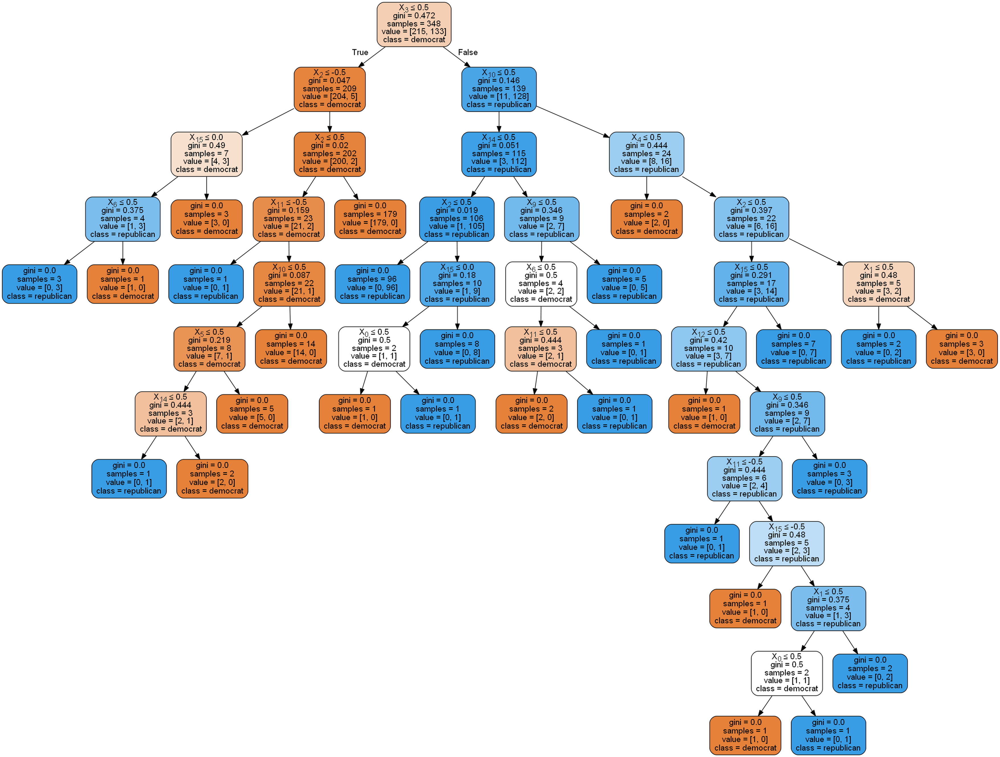

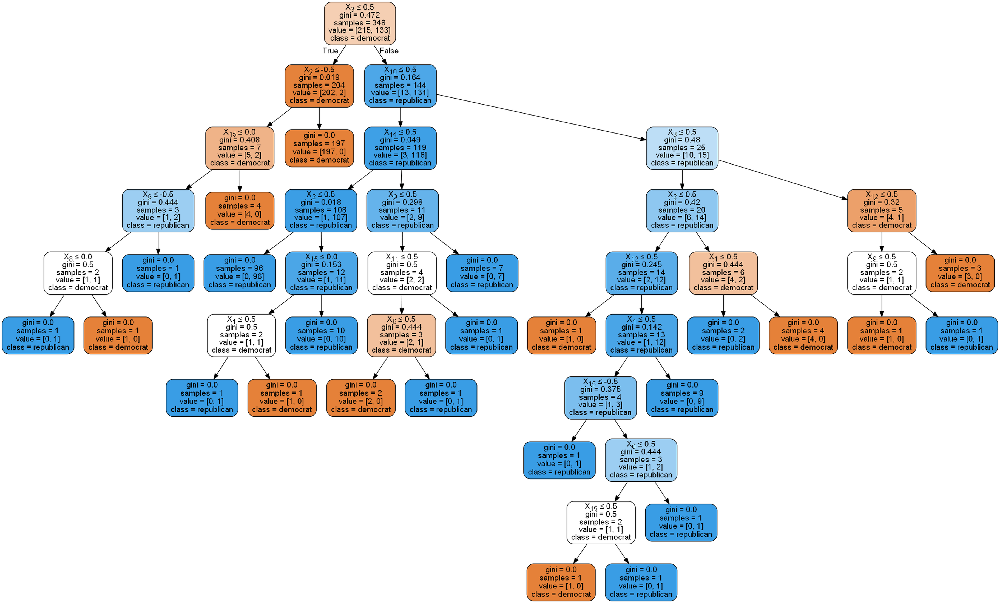

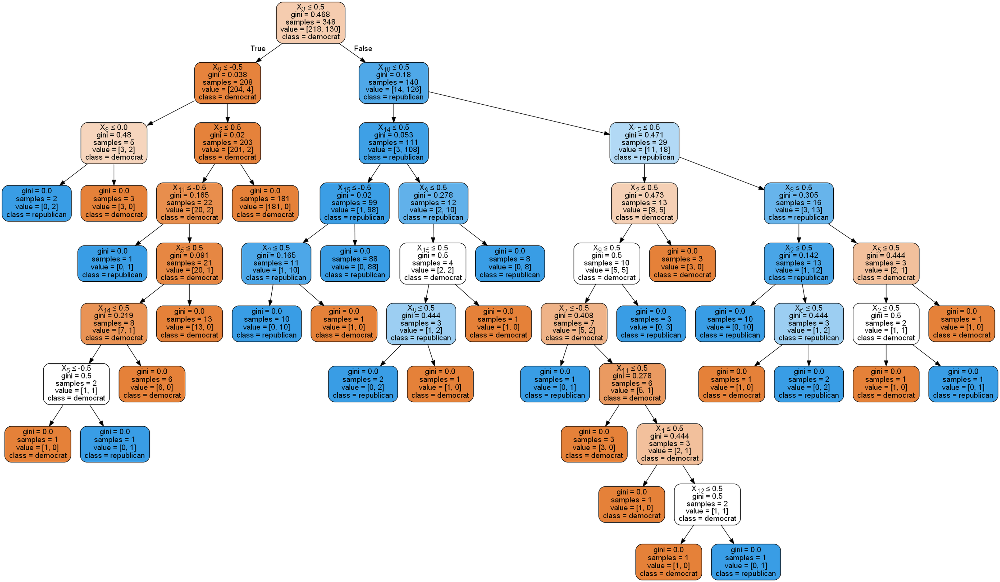

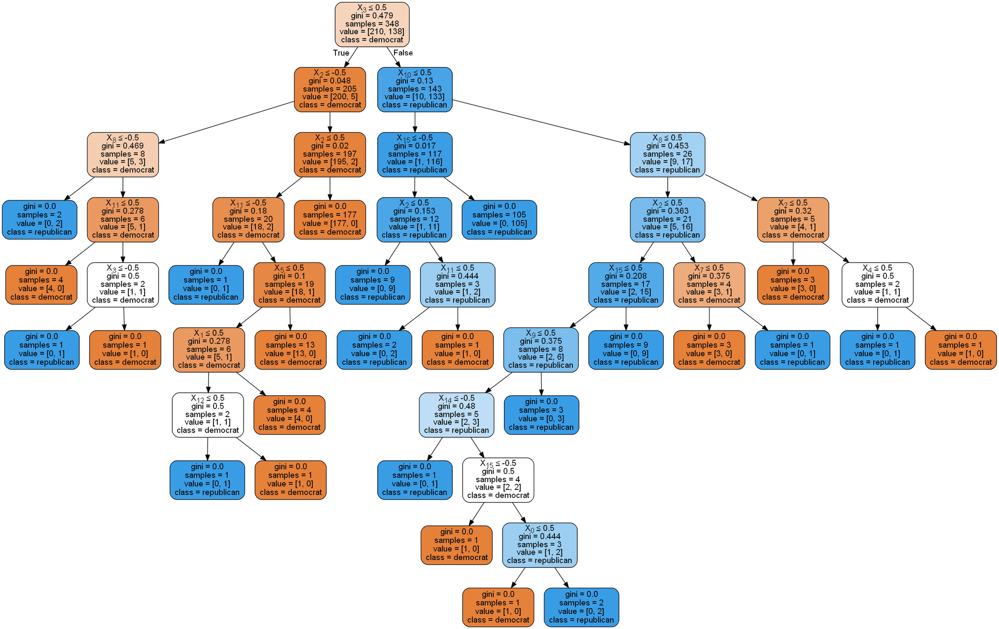

In [22]:
import numpy as np
import sklearn
from sklearn import tree
import graphviz
import IPython
import PIL
from IPython.display import display, Image
from sklearn.impute import SimpleImputer
from sklearn.model_selection import KFold 
from PIL import Image as imm
import pydotplus
import os
import sys
os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

print('python ' +sys.version)
print('numpy '+ np.__version__)
print('sklearn '+ sklearn.__version__)
print('graphviz '+ graphviz.__version__)
print('IPython '+ IPython.__version__)
print('PIL '+ PIL.__version__,'\n\n')



data = open('house-votes-84.data','r').read().splitlines();
dt_size = np.shape(data);
dt_x = np.zeros([dt_size[0],16]);
dt_y = [];      

for i in range(0,dt_size[0]):
    aa = data[i].split(',')
    dt_y.append('republican' if aa[0]=='republican' else 'democrat')
    dt_x[i,:] = [-1 if aa[x+1]=='?' else 1 if aa[x+1]=='y' else 0 for x in range(0,16)]

dt_y = np.asarray(dt_y)
kfold = 5

# impute = SimpleImputer(missing_values=-1, strategy='most_frequent')
# impute.fit(dt_x)
# dt_x = impute.transform(dt_x)
tr_acc = []
ts_acc = []
i=1
kf = KFold(n_splits=kfold, random_state=2435, shuffle=True)
kf.get_n_splits(dt_x)
for train_index, test_index in kf.split(dt_x):
    X_train, X_test = dt_x[train_index], dt_x[test_index]
    y_train, y_test = dt_y[train_index], dt_y[test_index]
    
    ctree = tree.DecisionTreeClassifier()
    ctree = ctree.fit(X_train, y_train)
    tr_acc.append(ctree.score(X_train, y_train))
    ts_acc.append(ctree.score(X_test, y_test))
    tree_pp = tree.export_graphviz(ctree, out_file = None, feature_names = X_train.dtype.names, 
                                class_names=['democrat','republican'], 
                                filled=True, rounded=True,  
                                special_characters=True)
    tree_plot = pydotplus.graph_from_dot_data(tree_pp)
#     tree_plot.write_pdf('Q1_tree'+str(i)+'.pdf')
    tree_plot.write_png('Q1_tree'+str(i)+'.png')
    img_org = imm.open('Q1_tree'+str(i)+'.png')
    width_org, height_org = img_org.size
    factor = 1.5
    width = int(width_org * factor)
    height = int(height_org * factor)
    img_anti = img_org.resize((width, height), imm.ANTIALIAS)
    img_anti.save('Q1_tree'+str(i)+'.png')
    display(img_anti)
    i+=1
    
print('Train and Testing Accuracy:')
for i in range(5):
    print('Fold %d:   Training Accuracy: %.2f%%      Tesing Accuracy: %.2f%%' %(i+1, tr_acc[i]*100, ts_acc[i]*100))
    


Clearly, all five trees are different. They have different with respect to split, depth and leaves. Also, all these five trees are different than the tree produced in problem 1.

Also, we can see all five trees have 100% training accuracy (since we did not impose any restriction on tree depth or pruning to avoid overfitting. However, the test accuracies are different though they are close and within 93% to 98% that is about 5% different. 